# Star Clusters 

Star clusters and stellar associations of all kinds enable a wealth of science, and were the subject of several White Papers. 

The purpose of this notebook is to explore the sky regions recommended for observations.

In [1]:
from os import path
import json
import config_utils
import regions
import matplotlib.pyplot as plt
import numpy as np
from astropy.table import Table, Column
from mw_plot import MWSkyMap, MWSkyMapBokeh
from astropy_healpix import HEALPix
from astropy import units as u
from astropy.coordinates import Galactic, TETE, SkyCoord
import healpy as hp

# Configure path to local repository
root_dir = '/Users/rstreet/software/rgps'

# HEALpixel grid resolution
NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
PIXAREA = hp.nside2pixarea(NSIDE, degrees=True)

The rgps_survey_regions.json file contains the database of the regions requested for survey by the community. Within this file, science cases area categorized so that we can select those cases relating to star clusters, using those that are marked "ready_to_use" indicating that sufficient detail has been provided that the region and filter selection is known. 

Note that a few Science Pitches requested wide-area surveys for stellar associations (especially searching for unknown ones).  These are not included in this notebook, since here we focus on surveys targeting specific regions of interest. 

In [2]:
config = config_utils.read_config(path.join(root_dir, 'config', 'rgps_survey_regions.json'))

In [3]:
cluster_science = {}

# Select from the set of science cases those relating to SFR science
for author, info in config.items():
    if info['ready_for_use'] and 'star-clusters' in info['category']:
        cluster_science[author] = info

print(str(len(cluster_science)) + ' science cases target specific star clusters.  Authors and summary:')
for author, info in cluster_science.items():
    print(author + ': ' + info['comment'])

4 science cases target specific star clusters.  Authors and summary:
Lodieu2: Selected Globular Clusters spanning a range of metallicities
Minniti: Free-floating planets in stellar associations; Lower Centaurus Crux (LCC)
Minniti2: Globular cluster pairs: UKS1 + VVVCL01 and NGC6522 + NGC6528 (Baade's Window)
Globular_Clusters: All known Globular Clusters


Plotting sky map vizualizations of these regions...

In [4]:
# Extracting the set of regions from the set of science cases 
requested_regions = regions.extract_requested_regions(cluster_science)
desired_regions = regions.calc_healpixel_regions(requested_regions)
desired_regions

{'F087': [<regions.CelestialRegion at 0x120f52d50>,
 'F106': [<regions.CelestialRegion at 0x121264850>,
 'F129': [<regions.CelestialRegion at 0x12129fd90>,
 'F158': [<regions.CelestialRegion at 0x1212a51d0>,
 'F184': [<regions.CelestialRegion at 0x121286990>,
 'F213': [<regions.CelestialRegion at 0x1212c1010>,
 'F146': [<regions.CelestialRegion at 0x121250750>,
 'G150': [],
 'P127': []}

In [5]:
# Build the combined regions per filter 
combined_regions = regions.combine_regions_per_filter(desired_regions)

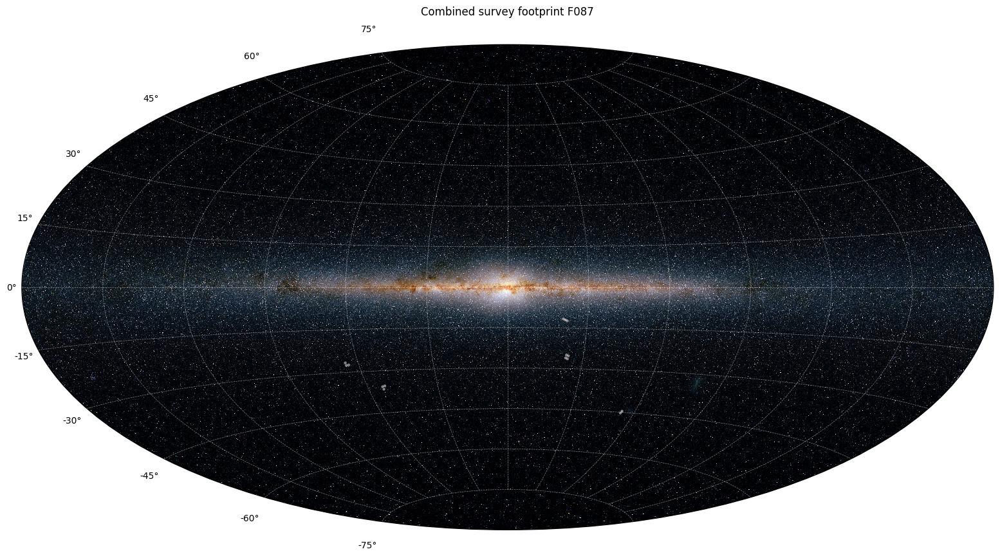

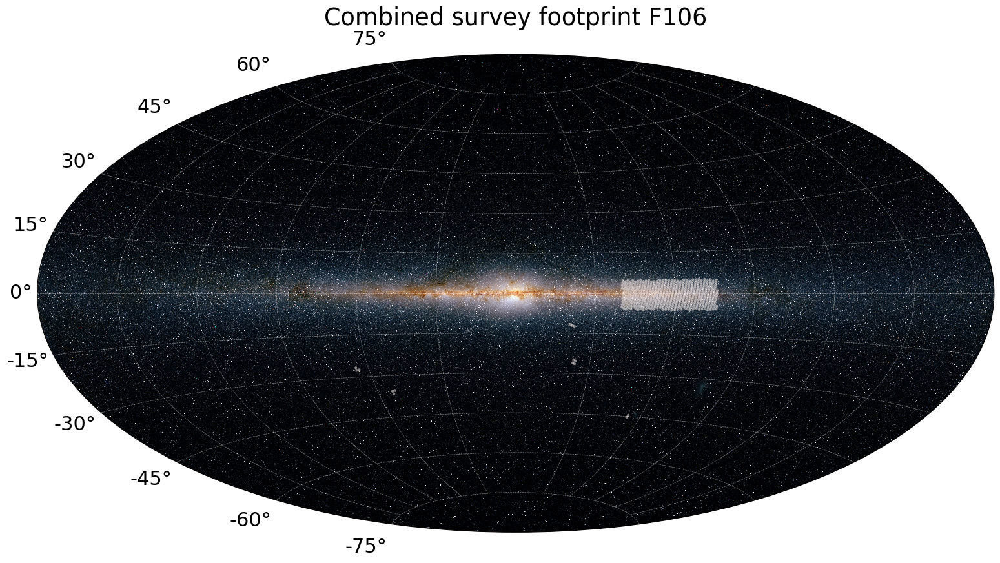

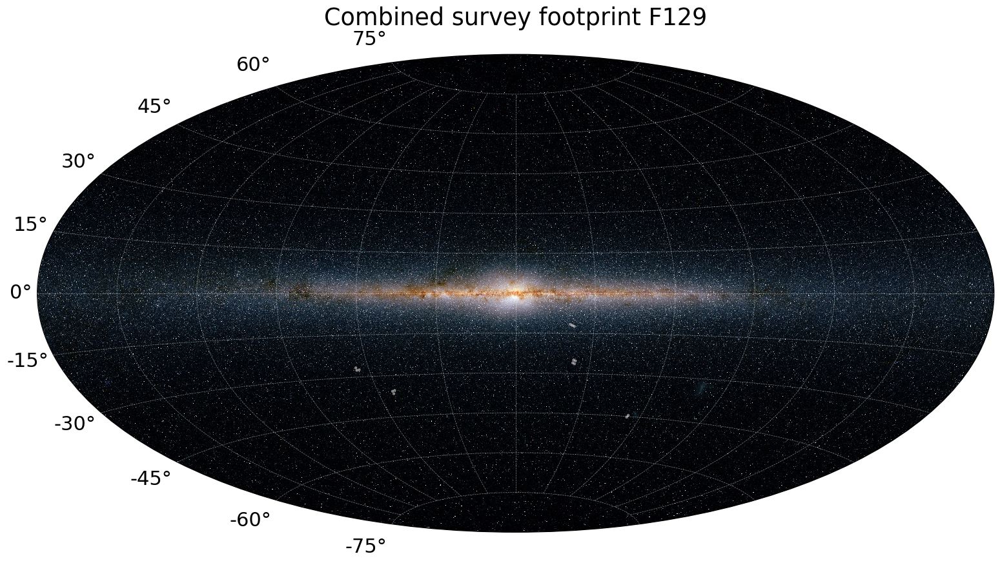

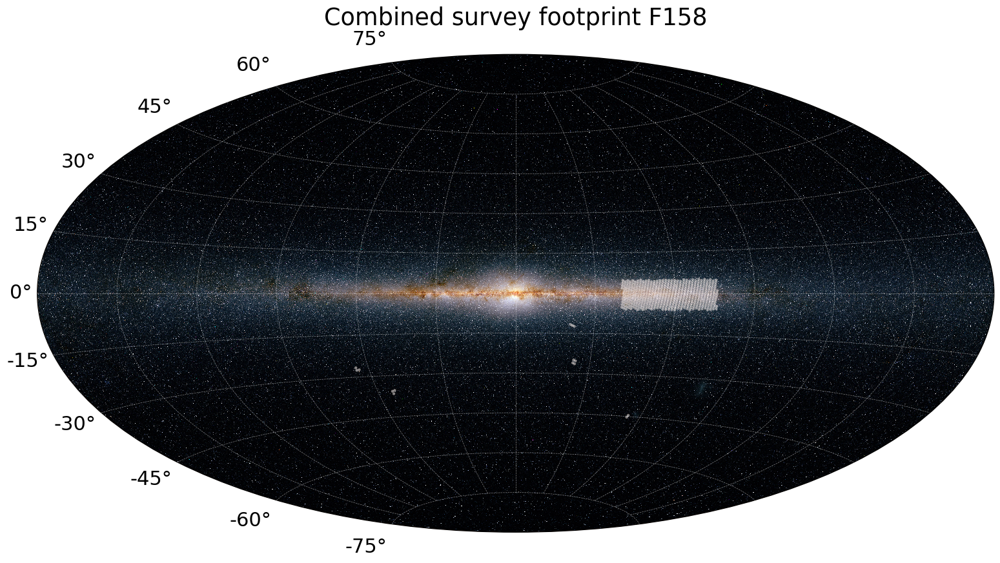

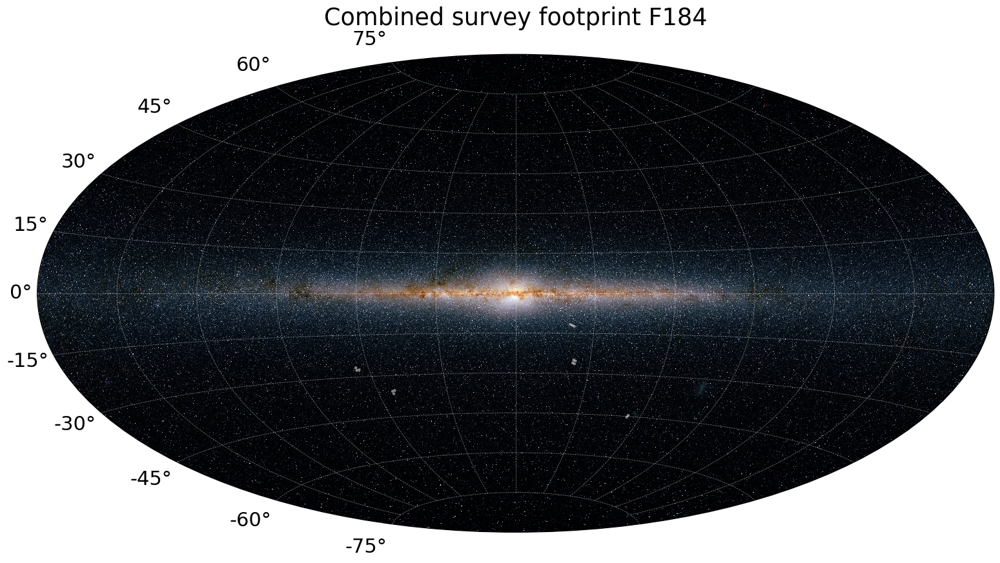

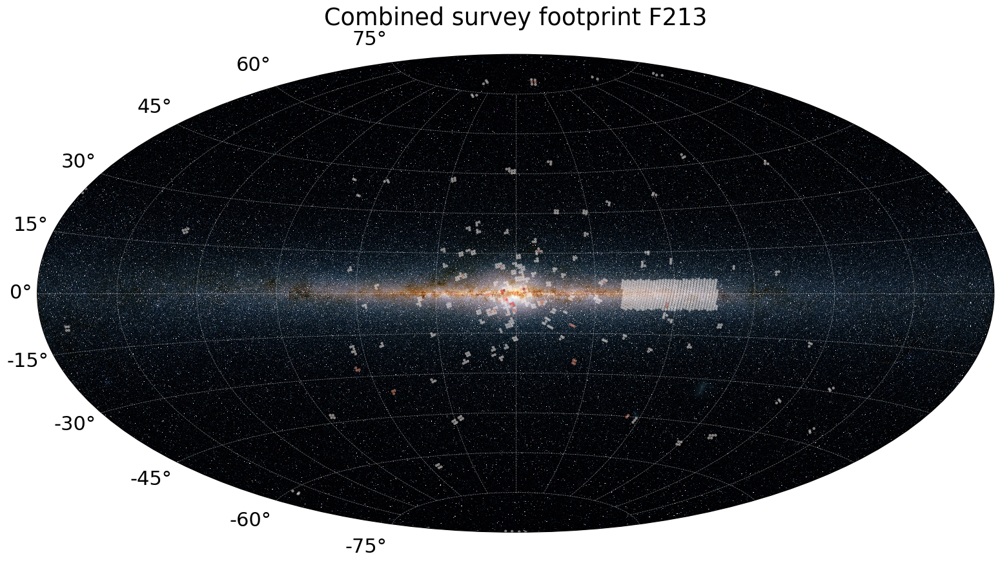

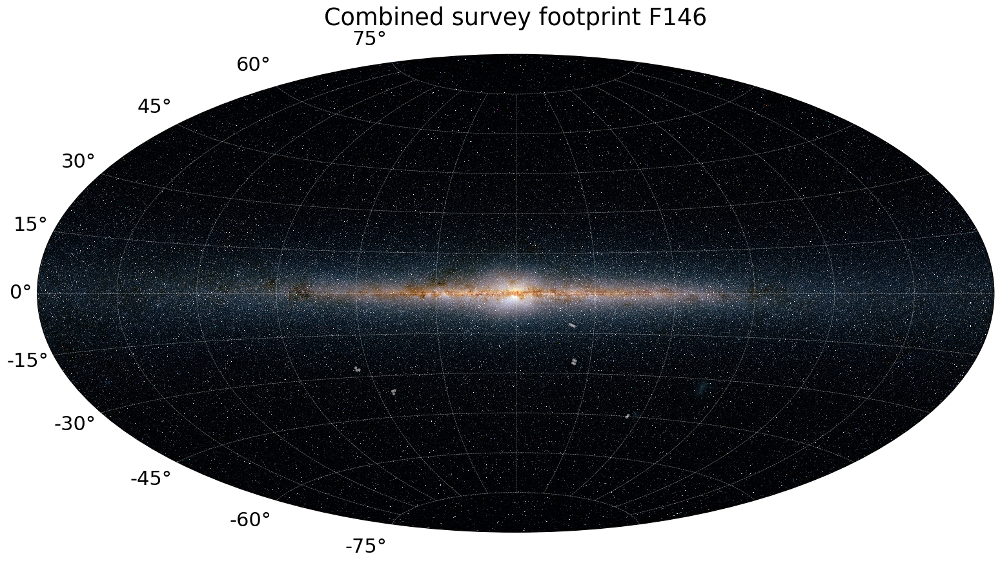

In [6]:
for optic, r_merge in combined_regions.items():
    mw1 = MWSkyMap(projection='aitoff', grayscale=False, grid='galactic', background='infrared', figsize=(16, 10))
    mw1.title = r_merge.label + ' ' + r_merge.optic
    s = r_merge.pixels_to_skycoords()
    mw1.scatter(s.ra.deg * u.deg, s.dec.deg * u.deg, c=r_merge.region_map[r_merge.pixels], cmap='Reds', s=5, alpha=0.4)
    plt.rcParams.update({'font.size': 22})

    plt.tight_layout()
    plt.savefig(path.join(root_dir, 'survey_maps', 'survey_map_'+r_merge.optic+'.png'))

Note that the catalog of Globular Clusters has been included here for a single filter - F213 - without prioritization.  This ensures that the clusters will be included in the optimization of the maps but only for that filter, so this remains to be considered.  

As with SFRs, we can use these maps to calculate the total sky area required to include 